In [53]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
from torchvision import datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torchvision.transforms import ToTensor
import os
from tqdm import tqdm
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# 1. Get Data

In [10]:
# Root directory for dataset
dataroot = "data/celeba"

batch_size = 128

image_size = 64

num_channels = 3

# Number of channels in the training images. For color images this is 3
num_channels = 3

# Size of z latent vector (i.e. size of generator input)
embedding_dim_generator = 100

# Size of feature maps in generator
generator_feature_map_size = 64

# Size of feature maps in discriminator
discriminator_feature_map_size = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

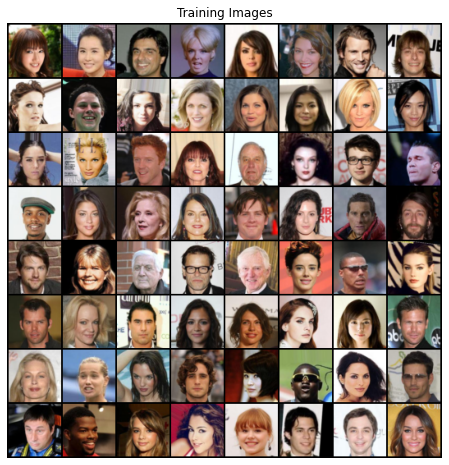

In [41]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = datasets.ImageFolder(root=dataroot,
                               transform=transform)
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=os.cpu_count())

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

# 2. Weights initialization

From the DCGAN paper, the authors specify that all model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02. The weights_init function takes an initialized model as input and reinitializes all convolutional, convolutional-transpose, and batch normalization layers to meet this criteria. This function is applied to the models immediately after initialization.

In [9]:
def weights_init(m):
    classname = m.__class__.__name__
    
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# 3. Generator

The generator, GG, is designed to map the latent space vector (zz) to data-space. Since our data are images, converting zz to data-space means ultimately creating a RGB image with the same size as the training images (i.e. 3x64x64). In practice, this is accomplished through a series of strided two dimensional convolutional transpose layers, each paired with a 2d batch norm layer and a relu activation. The output of the generator is fed through a tanh function to return it to the input data range of [-1,1][−1,1]. It is worth noting the existence of the batch norm functions after the conv-transpose layers, as this is a critical contribution of the DCGAN paper. These layers help with the flow of gradients during training. An image of the generator from the DCGAN paper is shown below.

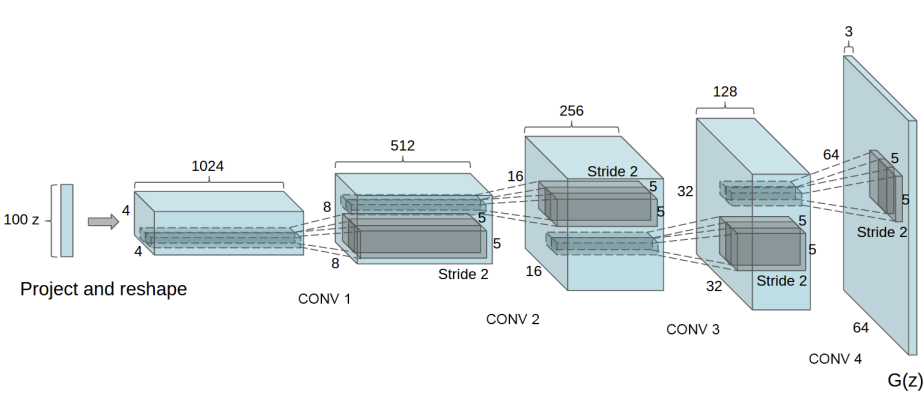

In [45]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(in_channels=embedding_dim_generator,
                               out_channels=generator_feature_map_size * 8,
                               kernel_size=4,
                               stride=1,
                               padding=0,
                               bias=False),
            nn.BatchNorm2d(generator_feature_map_size * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(in_channels=generator_feature_map_size * 8,
                               out_channels=generator_feature_map_size * 4, 
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(generator_feature_map_size * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(in_channels=generator_feature_map_size * 4,
                               out_channels=generator_feature_map_size * 2,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(generator_feature_map_size * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(in_channels=generator_feature_map_size * 2,
                               out_channels=generator_feature_map_size,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(generator_feature_map_size),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(in_channels=generator_feature_map_size, 
                               out_channels=num_channels, 
                               kernel_size=4, 
                               stride=2, 
                               padding=1, 
                               bias=False),
            nn.Tanh()
        )
    def forward(self, input):
        return self.main(input)

In [46]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# 4. Discriminator

As mentioned, the discriminator, DD, is a binary classification network that takes an image as input and outputs a scalar probability that the input image is real (as opposed to fake). Here, DD takes a 3x64x64 input image, processes it through a series of Conv2d, BatchNorm2d, and LeakyReLU layers, and outputs the final probability through a Sigmoid activation function. This architecture can be extended with more layers if necessary for the problem, but there is significance to the use of the strided convolution, BatchNorm, and LeakyReLUs. The DCGAN paper mentions it is a good practice to use strided convolution rather than pooling to downsample because it lets the network learn its own pooling function. Also batch norm and leaky relu functions promote healthy gradient flow which is critical for the learning process of both GG and DD.

In [49]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(num_channels, discriminator_feature_map_size, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(discriminator_feature_map_size, discriminator_feature_map_size * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_feature_map_size * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(discriminator_feature_map_size * 2, discriminator_feature_map_size * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_feature_map_size * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(discriminator_feature_map_size * 4, discriminator_feature_map_size * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(discriminator_feature_map_size * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(discriminator_feature_map_size * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [50]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [51]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, embedding_dim_generator, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# 5. Training

In [55]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

for epoch in tqdm(range(num_epochs)):
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()
        
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, embedding_dim_generator, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 5 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

  0%|                                                     | 0/5 [00:00<?, ?it/s]

[0/5][0/1047]	Loss_D: 1.6788	Loss_G: 4.4800	D(x): 0.4888	D(G(z)): 0.5023 / 0.0159
[0/5][5/1047]	Loss_D: 0.5729	Loss_G: 7.3544	D(x): 0.8852	D(G(z)): 0.2156 / 0.0011
[0/5][10/1047]	Loss_D: 0.4562	Loss_G: 9.2576	D(x): 0.9004	D(G(z)): 0.1565 / 0.0002
[0/5][15/1047]	Loss_D: 0.1081	Loss_G: 9.4678	D(x): 0.9498	D(G(z)): 0.0357 / 0.0001
[0/5][20/1047]	Loss_D: 0.1869	Loss_G: 19.6340	D(x): 0.9027	D(G(z)): 0.0000 / 0.0000
[0/5][25/1047]	Loss_D: 0.4017	Loss_G: 21.3519	D(x): 0.8153	D(G(z)): 0.0000 / 0.0000
[0/5][30/1047]	Loss_D: 0.1994	Loss_G: 21.3912	D(x): 0.8867	D(G(z)): 0.0000 / 0.0000
[0/5][35/1047]	Loss_D: 0.4029	Loss_G: 23.3780	D(x): 0.8481	D(G(z)): 0.0000 / 0.0000
[0/5][40/1047]	Loss_D: 0.3563	Loss_G: 21.2318	D(x): 0.8299	D(G(z)): 0.0000 / 0.0000
[0/5][45/1047]	Loss_D: 0.4086	Loss_G: 20.9942	D(x): 0.8501	D(G(z)): 0.0000 / 0.0000
[0/5][50/1047]	Loss_D: 0.6234	Loss_G: 25.7955	D(x): 0.7725	D(G(z)): 0.0000 / 0.0000
[0/5][55/1047]	Loss_D: 0.2495	Loss_G: 26.3018	D(x): 0.8889	D(G(z)): 0.0000 / 0.000

[0/5][490/1047]	Loss_D: 0.5538	Loss_G: 4.0514	D(x): 0.8699	D(G(z)): 0.2844 / 0.0320
[0/5][495/1047]	Loss_D: 0.3865	Loss_G: 4.4661	D(x): 0.8496	D(G(z)): 0.1167 / 0.0197
[0/5][500/1047]	Loss_D: 0.6643	Loss_G: 5.7935	D(x): 0.6152	D(G(z)): 0.0088 / 0.0061
[0/5][505/1047]	Loss_D: 0.6203	Loss_G: 6.0423	D(x): 0.8456	D(G(z)): 0.2823 / 0.0056
[0/5][510/1047]	Loss_D: 0.3968	Loss_G: 4.8006	D(x): 0.8551	D(G(z)): 0.1666 / 0.0142
[0/5][515/1047]	Loss_D: 0.4718	Loss_G: 4.3447	D(x): 0.7843	D(G(z)): 0.0945 / 0.0284
[0/5][520/1047]	Loss_D: 0.3354	Loss_G: 4.3980	D(x): 0.8288	D(G(z)): 0.1013 / 0.0177
[0/5][525/1047]	Loss_D: 0.4956	Loss_G: 4.1478	D(x): 0.7991	D(G(z)): 0.1783 / 0.0263
[0/5][530/1047]	Loss_D: 0.9352	Loss_G: 8.8270	D(x): 0.9469	D(G(z)): 0.5364 / 0.0003
[0/5][535/1047]	Loss_D: 0.5801	Loss_G: 5.2852	D(x): 0.8416	D(G(z)): 0.2785 / 0.0103
[0/5][540/1047]	Loss_D: 0.4892	Loss_G: 3.9648	D(x): 0.7056	D(G(z)): 0.0406 / 0.0345
[0/5][545/1047]	Loss_D: 0.5196	Loss_G: 5.3072	D(x): 0.8372	D(G(z)): 0.2423 /

[0/5][980/1047]	Loss_D: 0.4833	Loss_G: 5.4359	D(x): 0.9643	D(G(z)): 0.2903 / 0.0122
[0/5][985/1047]	Loss_D: 0.4676	Loss_G: 5.1116	D(x): 0.8967	D(G(z)): 0.2472 / 0.0127
[0/5][990/1047]	Loss_D: 0.8005	Loss_G: 6.5408	D(x): 0.9585	D(G(z)): 0.4569 / 0.0036
[0/5][995/1047]	Loss_D: 0.4848	Loss_G: 3.6226	D(x): 0.8880	D(G(z)): 0.2377 / 0.0450
[0/5][1000/1047]	Loss_D: 1.5609	Loss_G: 3.7330	D(x): 0.3395	D(G(z)): 0.0033 / 0.0487
[0/5][1005/1047]	Loss_D: 0.3767	Loss_G: 4.6955	D(x): 0.8932	D(G(z)): 0.1856 / 0.0196
[0/5][1010/1047]	Loss_D: 0.8495	Loss_G: 5.5409	D(x): 0.9471	D(G(z)): 0.4544 / 0.0093
[0/5][1015/1047]	Loss_D: 0.4233	Loss_G: 3.1363	D(x): 0.8207	D(G(z)): 0.1472 / 0.0739
[0/5][1020/1047]	Loss_D: 0.5066	Loss_G: 4.1969	D(x): 0.8044	D(G(z)): 0.1807 / 0.0253
[0/5][1025/1047]	Loss_D: 0.8671	Loss_G: 6.5493	D(x): 0.9351	D(G(z)): 0.4734 / 0.0046
[0/5][1030/1047]	Loss_D: 0.3548	Loss_G: 4.4371	D(x): 0.8885	D(G(z)): 0.1742 / 0.0208
[0/5][1035/1047]	Loss_D: 0.5247	Loss_G: 2.5020	D(x): 0.7165	D(G(z)): 

 20%|████████▊                                   | 1/5 [10:12<40:48, 612.02s/it]

[0/5][1045/1047]	Loss_D: 0.4393	Loss_G: 4.8597	D(x): 0.8539	D(G(z)): 0.1765 / 0.0215
[1/5][0/1047]	Loss_D: 0.9407	Loss_G: 7.7059	D(x): 0.9488	D(G(z)): 0.5087 / 0.0019
[1/5][5/1047]	Loss_D: 0.7103	Loss_G: 2.4373	D(x): 0.6692	D(G(z)): 0.1278 / 0.1420
[1/5][10/1047]	Loss_D: 0.4045	Loss_G: 4.1476	D(x): 0.7514	D(G(z)): 0.0408 / 0.0361
[1/5][15/1047]	Loss_D: 2.5161	Loss_G: 2.3366	D(x): 0.1799	D(G(z)): 0.0005 / 0.1820
[1/5][20/1047]	Loss_D: 0.6107	Loss_G: 4.0160	D(x): 0.7153	D(G(z)): 0.1322 / 0.0341
[1/5][25/1047]	Loss_D: 0.8743	Loss_G: 2.1986	D(x): 0.6396	D(G(z)): 0.1692 / 0.1867
[1/5][30/1047]	Loss_D: 1.4351	Loss_G: 2.7335	D(x): 0.3908	D(G(z)): 0.0395 / 0.1270
[1/5][35/1047]	Loss_D: 0.8796	Loss_G: 6.5614	D(x): 0.8891	D(G(z)): 0.4731 / 0.0038
[1/5][40/1047]	Loss_D: 1.2022	Loss_G: 8.3115	D(x): 0.8682	D(G(z)): 0.5628 / 0.0009
[1/5][45/1047]	Loss_D: 0.7837	Loss_G: 3.1623	D(x): 0.7393	D(G(z)): 0.2612 / 0.0756
[1/5][50/1047]	Loss_D: 0.2985	Loss_G: 4.2722	D(x): 0.8515	D(G(z)): 0.0765 / 0.0302
[1/5

[1/5][485/1047]	Loss_D: 0.5419	Loss_G: 3.5516	D(x): 0.6852	D(G(z)): 0.0394 / 0.0522
[1/5][490/1047]	Loss_D: 0.5315	Loss_G: 4.6991	D(x): 0.8305	D(G(z)): 0.2321 / 0.0143
[1/5][495/1047]	Loss_D: 0.3107	Loss_G: 3.8862	D(x): 0.8192	D(G(z)): 0.0726 / 0.0347
[1/5][500/1047]	Loss_D: 0.4617	Loss_G: 3.2981	D(x): 0.8191	D(G(z)): 0.1751 / 0.0536
[1/5][505/1047]	Loss_D: 0.3720	Loss_G: 4.5354	D(x): 0.8850	D(G(z)): 0.1861 / 0.0208
[1/5][510/1047]	Loss_D: 0.7027	Loss_G: 2.0424	D(x): 0.5938	D(G(z)): 0.0282 / 0.1822
[1/5][515/1047]	Loss_D: 0.6569	Loss_G: 5.5863	D(x): 0.9674	D(G(z)): 0.3837 / 0.0105
[1/5][520/1047]	Loss_D: 0.9711	Loss_G: 1.1840	D(x): 0.5172	D(G(z)): 0.0356 / 0.4118
[1/5][525/1047]	Loss_D: 0.5821	Loss_G: 4.6629	D(x): 0.9523	D(G(z)): 0.3540 / 0.0199
[1/5][530/1047]	Loss_D: 0.9602	Loss_G: 6.6185	D(x): 0.9222	D(G(z)): 0.5086 / 0.0030
[1/5][535/1047]	Loss_D: 0.9323	Loss_G: 2.3407	D(x): 0.5339	D(G(z)): 0.0603 / 0.1842
[1/5][540/1047]	Loss_D: 0.5542	Loss_G: 2.7707	D(x): 0.6958	D(G(z)): 0.0840 /

[1/5][975/1047]	Loss_D: 0.2858	Loss_G: 4.0454	D(x): 0.8754	D(G(z)): 0.1216 / 0.0298
[1/5][980/1047]	Loss_D: 0.4285	Loss_G: 3.0139	D(x): 0.7967	D(G(z)): 0.1373 / 0.0756
[1/5][985/1047]	Loss_D: 0.5130	Loss_G: 2.7609	D(x): 0.7547	D(G(z)): 0.1405 / 0.0965
[1/5][990/1047]	Loss_D: 0.4513	Loss_G: 4.0703	D(x): 0.8721	D(G(z)): 0.2243 / 0.0288
[1/5][995/1047]	Loss_D: 0.4022	Loss_G: 3.8082	D(x): 0.8917	D(G(z)): 0.2149 / 0.0384
[1/5][1000/1047]	Loss_D: 0.3769	Loss_G: 3.4681	D(x): 0.7772	D(G(z)): 0.0521 / 0.0553
[1/5][1005/1047]	Loss_D: 0.4077	Loss_G: 3.1970	D(x): 0.7334	D(G(z)): 0.0298 / 0.0643
[1/5][1010/1047]	Loss_D: 0.5260	Loss_G: 2.5964	D(x): 0.6748	D(G(z)): 0.0272 / 0.1150
[1/5][1015/1047]	Loss_D: 0.4669	Loss_G: 3.9707	D(x): 0.8534	D(G(z)): 0.2203 / 0.0332
[1/5][1020/1047]	Loss_D: 0.4724	Loss_G: 5.3222	D(x): 0.9548	D(G(z)): 0.3069 / 0.0087
[1/5][1025/1047]	Loss_D: 2.4463	Loss_G: 3.2498	D(x): 0.1647	D(G(z)): 0.0021 / 0.0933
[1/5][1030/1047]	Loss_D: 0.5649	Loss_G: 1.9022	D(x): 0.7001	D(G(z)): 0

 40%|█████████████████▌                          | 2/5 [11:56<15:41, 313.76s/it]

[1/5][1045/1047]	Loss_D: 0.6002	Loss_G: 4.5084	D(x): 0.8377	D(G(z)): 0.2957 / 0.0199
[2/5][0/1047]	Loss_D: 0.9048	Loss_G: 6.5288	D(x): 0.9072	D(G(z)): 0.4811 / 0.0025
[2/5][5/1047]	Loss_D: 0.8531	Loss_G: 3.6255	D(x): 0.5270	D(G(z)): 0.0225 / 0.0516
[2/5][10/1047]	Loss_D: 0.4879	Loss_G: 4.0863	D(x): 0.8511	D(G(z)): 0.2239 / 0.0305
[2/5][15/1047]	Loss_D: 0.5081	Loss_G: 3.1136	D(x): 0.7565	D(G(z)): 0.1555 / 0.0737
[2/5][20/1047]	Loss_D: 0.5734	Loss_G: 3.8322	D(x): 0.8132	D(G(z)): 0.2681 / 0.0312
[2/5][25/1047]	Loss_D: 0.3977	Loss_G: 4.3604	D(x): 0.9109	D(G(z)): 0.2330 / 0.0209
[2/5][30/1047]	Loss_D: 0.4809	Loss_G: 4.2116	D(x): 0.8748	D(G(z)): 0.2480 / 0.0246
[2/5][35/1047]	Loss_D: 0.4053	Loss_G: 3.6344	D(x): 0.8378	D(G(z)): 0.1762 / 0.0390
[2/5][40/1047]	Loss_D: 0.6210	Loss_G: 5.3498	D(x): 0.8826	D(G(z)): 0.3411 / 0.0078
[2/5][45/1047]	Loss_D: 0.4552	Loss_G: 2.7143	D(x): 0.7531	D(G(z)): 0.1148 / 0.0892
[2/5][50/1047]	Loss_D: 0.4726	Loss_G: 5.1891	D(x): 0.9360	D(G(z)): 0.3025 / 0.0084
[2/5

[2/5][485/1047]	Loss_D: 0.3735	Loss_G: 2.5075	D(x): 0.8236	D(G(z)): 0.1380 / 0.1133
[2/5][490/1047]	Loss_D: 0.6095	Loss_G: 1.8627	D(x): 0.6999	D(G(z)): 0.1565 / 0.1996
[2/5][495/1047]	Loss_D: 0.3395	Loss_G: 2.8339	D(x): 0.8764	D(G(z)): 0.1640 / 0.0843
[2/5][500/1047]	Loss_D: 0.5050	Loss_G: 2.9550	D(x): 0.7918	D(G(z)): 0.1916 / 0.0726
[2/5][505/1047]	Loss_D: 0.4627	Loss_G: 4.4149	D(x): 0.9045	D(G(z)): 0.2712 / 0.0179
[2/5][510/1047]	Loss_D: 0.3486	Loss_G: 2.7686	D(x): 0.8738	D(G(z)): 0.1616 / 0.0826
[2/5][515/1047]	Loss_D: 0.4105	Loss_G: 3.2655	D(x): 0.8409	D(G(z)): 0.1766 / 0.0536
[2/5][520/1047]	Loss_D: 0.3796	Loss_G: 2.2370	D(x): 0.7912	D(G(z)): 0.1028 / 0.1354
[2/5][525/1047]	Loss_D: 0.4502	Loss_G: 3.4201	D(x): 0.8744	D(G(z)): 0.2299 / 0.0605
[2/5][530/1047]	Loss_D: 0.3628	Loss_G: 3.6736	D(x): 0.8909	D(G(z)): 0.1889 / 0.0384
[2/5][535/1047]	Loss_D: 1.3382	Loss_G: 7.8203	D(x): 0.9606	D(G(z)): 0.6641 / 0.0015
[2/5][540/1047]	Loss_D: 0.9651	Loss_G: 2.0571	D(x): 0.5003	D(G(z)): 0.0166 /

[2/5][975/1047]	Loss_D: 0.4899	Loss_G: 2.9088	D(x): 0.7413	D(G(z)): 0.1030 / 0.0819
[2/5][980/1047]	Loss_D: 0.6988	Loss_G: 4.1078	D(x): 0.8469	D(G(z)): 0.3605 / 0.0252
[2/5][985/1047]	Loss_D: 1.4402	Loss_G: 0.2446	D(x): 0.3418	D(G(z)): 0.0213 / 0.8121
[2/5][990/1047]	Loss_D: 0.9548	Loss_G: 4.4546	D(x): 0.9431	D(G(z)): 0.5174 / 0.0285
[2/5][995/1047]	Loss_D: 0.8495	Loss_G: 4.4970	D(x): 0.8286	D(G(z)): 0.4190 / 0.0168
[2/5][1000/1047]	Loss_D: 0.9926	Loss_G: 1.5828	D(x): 0.4966	D(G(z)): 0.0877 / 0.2700
[2/5][1005/1047]	Loss_D: 0.4566	Loss_G: 3.1879	D(x): 0.8558	D(G(z)): 0.2217 / 0.0631
[2/5][1010/1047]	Loss_D: 0.4958	Loss_G: 3.0123	D(x): 0.8292	D(G(z)): 0.2223 / 0.0757
[2/5][1015/1047]	Loss_D: 0.4817	Loss_G: 3.1674	D(x): 0.7621	D(G(z)): 0.1343 / 0.0655
[2/5][1020/1047]	Loss_D: 0.4287	Loss_G: 2.8158	D(x): 0.7811	D(G(z)): 0.1226 / 0.0853
[2/5][1025/1047]	Loss_D: 0.5407	Loss_G: 3.6069	D(x): 0.8928	D(G(z)): 0.3128 / 0.0389
[2/5][1030/1047]	Loss_D: 0.5082	Loss_G: 3.2367	D(x): 0.8287	D(G(z)): 0

 60%|██████████████████████████▍                 | 3/5 [13:57<07:31, 225.50s/it]

[2/5][1045/1047]	Loss_D: 0.5504	Loss_G: 2.1667	D(x): 0.7007	D(G(z)): 0.1237 / 0.1542
[3/5][0/1047]	Loss_D: 0.4448	Loss_G: 2.6930	D(x): 0.7641	D(G(z)): 0.1305 / 0.0921
[3/5][5/1047]	Loss_D: 0.3906	Loss_G: 2.6158	D(x): 0.7870	D(G(z)): 0.1144 / 0.1004
[3/5][10/1047]	Loss_D: 1.0702	Loss_G: 5.8296	D(x): 0.9487	D(G(z)): 0.5857 / 0.0046
[3/5][15/1047]	Loss_D: 0.6049	Loss_G: 2.0777	D(x): 0.6378	D(G(z)): 0.0705 / 0.1715
[3/5][20/1047]	Loss_D: 0.9649	Loss_G: 1.2410	D(x): 0.4737	D(G(z)): 0.0493 / 0.3484
[3/5][25/1047]	Loss_D: 0.4371	Loss_G: 2.5918	D(x): 0.8246	D(G(z)): 0.1906 / 0.1073
[3/5][30/1047]	Loss_D: 0.4450	Loss_G: 2.7071	D(x): 0.8158	D(G(z)): 0.1784 / 0.0928
[3/5][35/1047]	Loss_D: 0.7250	Loss_G: 5.4081	D(x): 0.9252	D(G(z)): 0.4267 / 0.0074
[3/5][40/1047]	Loss_D: 0.4453	Loss_G: 3.1063	D(x): 0.7968	D(G(z)): 0.1588 / 0.0666
[3/5][45/1047]	Loss_D: 1.0919	Loss_G: 1.1303	D(x): 0.4529	D(G(z)): 0.1160 / 0.3951
[3/5][50/1047]	Loss_D: 1.0275	Loss_G: 4.0652	D(x): 0.9225	D(G(z)): 0.5326 / 0.0331
[3/5

[3/5][485/1047]	Loss_D: 0.4298	Loss_G: 2.2459	D(x): 0.7697	D(G(z)): 0.1213 / 0.1355
[3/5][490/1047]	Loss_D: 0.5592	Loss_G: 2.2213	D(x): 0.7544	D(G(z)): 0.1990 / 0.1551
[3/5][495/1047]	Loss_D: 1.1691	Loss_G: 4.5732	D(x): 0.9305	D(G(z)): 0.6030 / 0.0177
[3/5][500/1047]	Loss_D: 0.6411	Loss_G: 1.5638	D(x): 0.6217	D(G(z)): 0.0882 / 0.2612
[3/5][505/1047]	Loss_D: 0.6871	Loss_G: 3.5926	D(x): 0.9271	D(G(z)): 0.4195 / 0.0362
[3/5][510/1047]	Loss_D: 0.7713	Loss_G: 3.8136	D(x): 0.8602	D(G(z)): 0.4052 / 0.0344
[3/5][515/1047]	Loss_D: 0.4139	Loss_G: 3.1256	D(x): 0.8554	D(G(z)): 0.2047 / 0.0586
[3/5][520/1047]	Loss_D: 0.7079	Loss_G: 3.1924	D(x): 0.8959	D(G(z)): 0.4021 / 0.0573
[3/5][525/1047]	Loss_D: 0.4293	Loss_G: 2.5729	D(x): 0.8481	D(G(z)): 0.2060 / 0.0976
[3/5][530/1047]	Loss_D: 0.5251	Loss_G: 3.2947	D(x): 0.8923	D(G(z)): 0.3061 / 0.0535
[3/5][535/1047]	Loss_D: 0.5067	Loss_G: 2.3766	D(x): 0.7471	D(G(z)): 0.1589 / 0.1233
[3/5][540/1047]	Loss_D: 0.6802	Loss_G: 4.3227	D(x): 0.9385	D(G(z)): 0.4205 /

[3/5][975/1047]	Loss_D: 0.4132	Loss_G: 2.4513	D(x): 0.8066	D(G(z)): 0.1466 / 0.1208
[3/5][980/1047]	Loss_D: 0.7988	Loss_G: 3.2471	D(x): 0.8064	D(G(z)): 0.3879 / 0.0537
[3/5][985/1047]	Loss_D: 0.3483	Loss_G: 2.9968	D(x): 0.8237	D(G(z)): 0.1211 / 0.0675
[3/5][990/1047]	Loss_D: 0.5276	Loss_G: 1.9091	D(x): 0.6856	D(G(z)): 0.0974 / 0.1869
[3/5][995/1047]	Loss_D: 0.6372	Loss_G: 1.6101	D(x): 0.6457	D(G(z)): 0.1317 / 0.2539
[3/5][1000/1047]	Loss_D: 0.6527	Loss_G: 1.4381	D(x): 0.6066	D(G(z)): 0.0577 / 0.2848
[3/5][1005/1047]	Loss_D: 0.5638	Loss_G: 1.8522	D(x): 0.6629	D(G(z)): 0.0908 / 0.2022
[3/5][1010/1047]	Loss_D: 0.7050	Loss_G: 3.3411	D(x): 0.8947	D(G(z)): 0.4107 / 0.0474
[3/5][1015/1047]	Loss_D: 0.4946	Loss_G: 2.2463	D(x): 0.7914	D(G(z)): 0.1952 / 0.1368
[3/5][1020/1047]	Loss_D: 0.4979	Loss_G: 3.4064	D(x): 0.8417	D(G(z)): 0.2428 / 0.0468
[3/5][1025/1047]	Loss_D: 0.5552	Loss_G: 2.2891	D(x): 0.6750	D(G(z)): 0.0966 / 0.1341
[3/5][1030/1047]	Loss_D: 0.5503	Loss_G: 1.9439	D(x): 0.6565	D(G(z)): 0

 80%|███████████████████████████████████▏        | 4/5 [16:02<03:05, 185.82s/it]

[4/5][0/1047]	Loss_D: 0.7711	Loss_G: 2.0375	D(x): 0.5902	D(G(z)): 0.1312 / 0.1782
[4/5][5/1047]	Loss_D: 1.1657	Loss_G: 0.7195	D(x): 0.4169	D(G(z)): 0.0648 / 0.5411
[4/5][10/1047]	Loss_D: 0.9097	Loss_G: 3.5448	D(x): 0.9081	D(G(z)): 0.5003 / 0.0470
[4/5][15/1047]	Loss_D: 0.7919	Loss_G: 1.8727	D(x): 0.5379	D(G(z)): 0.0643 / 0.2165
[4/5][20/1047]	Loss_D: 0.6047	Loss_G: 2.5518	D(x): 0.7251	D(G(z)): 0.1937 / 0.1004
[4/5][25/1047]	Loss_D: 0.7132	Loss_G: 2.8822	D(x): 0.8748	D(G(z)): 0.3876 / 0.0772
[4/5][30/1047]	Loss_D: 0.5463	Loss_G: 2.7767	D(x): 0.8030	D(G(z)): 0.2497 / 0.0802
[4/5][35/1047]	Loss_D: 0.9651	Loss_G: 3.3965	D(x): 0.8192	D(G(z)): 0.4800 / 0.0489
[4/5][40/1047]	Loss_D: 0.5529	Loss_G: 2.4231	D(x): 0.8039	D(G(z)): 0.2416 / 0.1249
[4/5][45/1047]	Loss_D: 0.7159	Loss_G: 3.1373	D(x): 0.8619	D(G(z)): 0.3972 / 0.0554
[4/5][50/1047]	Loss_D: 0.6122	Loss_G: 1.8739	D(x): 0.7399	D(G(z)): 0.2239 / 0.1907
[4/5][55/1047]	Loss_D: 0.7385	Loss_G: 3.6250	D(x): 0.9225	D(G(z)): 0.4312 / 0.0406
[4/5][

[4/5][490/1047]	Loss_D: 0.5415	Loss_G: 2.9524	D(x): 0.7999	D(G(z)): 0.2305 / 0.0706
[4/5][495/1047]	Loss_D: 0.5415	Loss_G: 2.1929	D(x): 0.7443	D(G(z)): 0.1795 / 0.1468
[4/5][500/1047]	Loss_D: 0.6854	Loss_G: 4.4402	D(x): 0.9524	D(G(z)): 0.4363 / 0.0179
[4/5][505/1047]	Loss_D: 0.4130	Loss_G: 2.8230	D(x): 0.8232	D(G(z)): 0.1682 / 0.0785
[4/5][510/1047]	Loss_D: 1.0349	Loss_G: 3.9022	D(x): 0.9388	D(G(z)): 0.5700 / 0.0337
[4/5][515/1047]	Loss_D: 0.6193	Loss_G: 2.2700	D(x): 0.6787	D(G(z)): 0.1383 / 0.1350
[4/5][520/1047]	Loss_D: 1.0964	Loss_G: 0.4475	D(x): 0.4069	D(G(z)): 0.0377 / 0.6688
[4/5][525/1047]	Loss_D: 2.3040	Loss_G: 5.2543	D(x): 0.9626	D(G(z)): 0.8500 / 0.0118
[4/5][530/1047]	Loss_D: 1.1379	Loss_G: 0.5928	D(x): 0.4660	D(G(z)): 0.1872 / 0.6013
[4/5][535/1047]	Loss_D: 0.9360	Loss_G: 1.1550	D(x): 0.4871	D(G(z)): 0.0603 / 0.3691
[4/5][540/1047]	Loss_D: 0.8286	Loss_G: 2.6516	D(x): 0.8804	D(G(z)): 0.4484 / 0.0957
[4/5][545/1047]	Loss_D: 0.6409	Loss_G: 2.4912	D(x): 0.7784	D(G(z)): 0.2734 /

[4/5][980/1047]	Loss_D: 1.3294	Loss_G: 4.1631	D(x): 0.9635	D(G(z)): 0.6604 / 0.0253
[4/5][985/1047]	Loss_D: 0.7916	Loss_G: 2.3826	D(x): 0.6820	D(G(z)): 0.2684 / 0.1198
[4/5][990/1047]	Loss_D: 0.5577	Loss_G: 2.6436	D(x): 0.7865	D(G(z)): 0.2425 / 0.0899
[4/5][995/1047]	Loss_D: 0.5236	Loss_G: 2.3903	D(x): 0.7250	D(G(z)): 0.1417 / 0.1194
[4/5][1000/1047]	Loss_D: 1.0205	Loss_G: 4.0135	D(x): 0.9271	D(G(z)): 0.5528 / 0.0276
[4/5][1005/1047]	Loss_D: 0.7409	Loss_G: 1.7498	D(x): 0.5902	D(G(z)): 0.1146 / 0.2238
[4/5][1010/1047]	Loss_D: 0.6480	Loss_G: 2.7297	D(x): 0.8584	D(G(z)): 0.3490 / 0.0820
[4/5][1015/1047]	Loss_D: 1.1015	Loss_G: 1.3361	D(x): 0.4086	D(G(z)): 0.0366 / 0.3068
[4/5][1020/1047]	Loss_D: 0.7923	Loss_G: 3.4360	D(x): 0.8957	D(G(z)): 0.4554 / 0.0420
[4/5][1025/1047]	Loss_D: 0.6643	Loss_G: 1.8697	D(x): 0.6732	D(G(z)): 0.1816 / 0.1892
[4/5][1030/1047]	Loss_D: 0.4275	Loss_G: 2.4282	D(x): 0.7830	D(G(z)): 0.1369 / 0.1126
[4/5][1035/1047]	Loss_D: 0.5304	Loss_G: 2.2931	D(x): 0.7106	D(G(z)): 

100%|████████████████████████████████████████████| 5/5 [18:13<00:00, 218.77s/it]

[4/5][1045/1047]	Loss_D: 0.5860	Loss_G: 2.9126	D(x): 0.8671	D(G(z)): 0.3278 / 0.0718


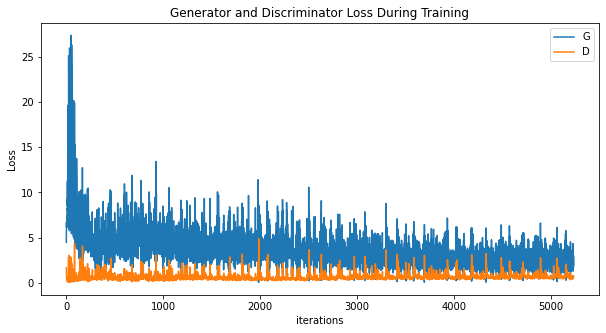

In [56]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

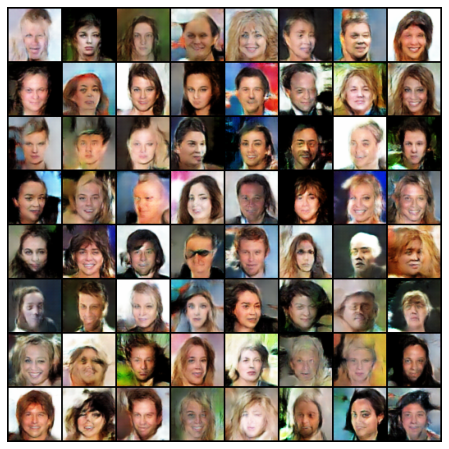

In [57]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

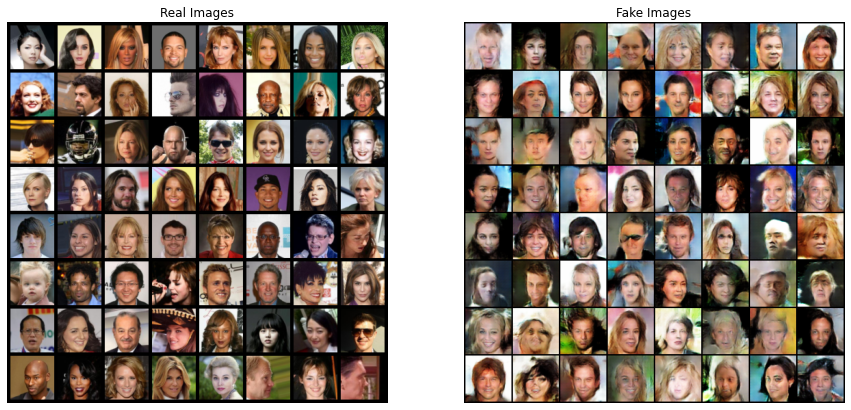

In [58]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()